# <center> Topic Analysis </center> 

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt 
import seaborn as sns           
import umap

from tqdm.notebook import tqdm_notebook
from wordcloud import WordCloud

from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import KMeans, AgglomerativeClustering

import pickle
import gensim
import matplotlib
%matplotlib inline

import sys
sys.path.append('../')
from src.utils import (
    plot_word_cloud, 
    get_umap_representation,
    plot_distortions,
    plot_dendrogram
)

In [2]:
# loading the model
model = gensim.models.LdaModel.load('../src/models/final_model_30_topics')
topics = model.show_topics(num_topics=30, num_words=100, formatted=False)

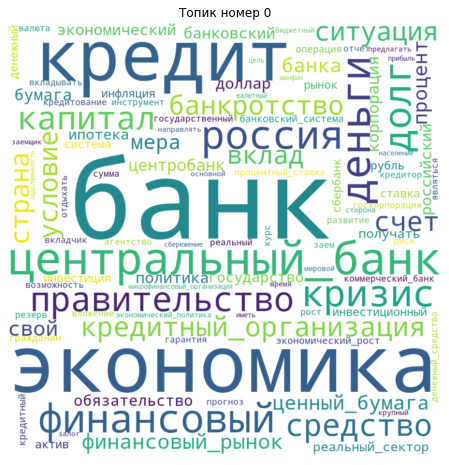

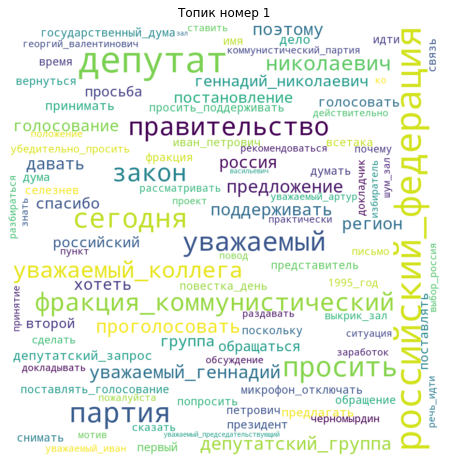

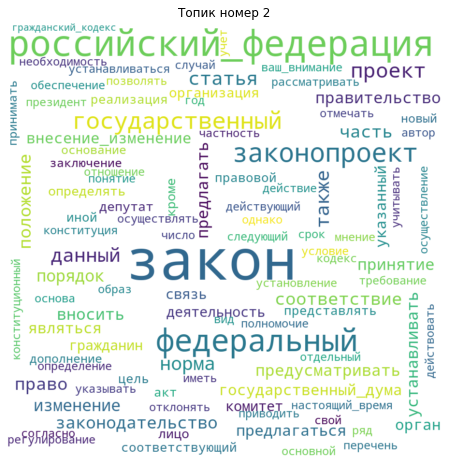

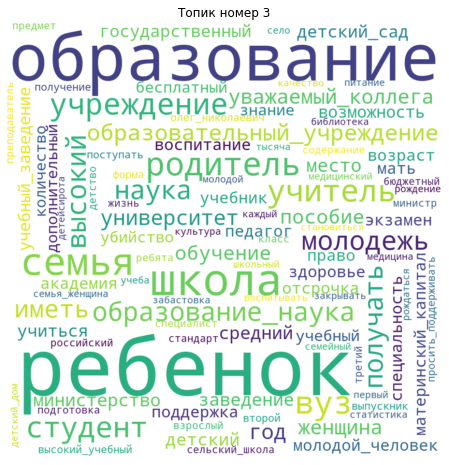

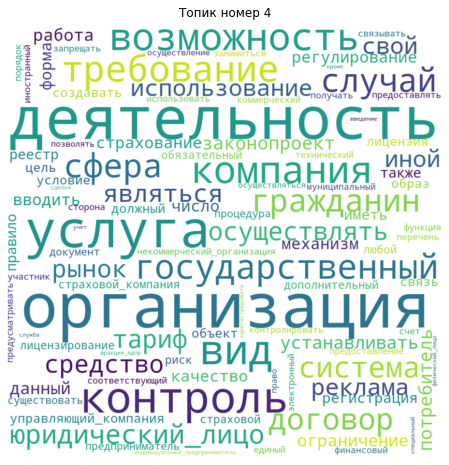

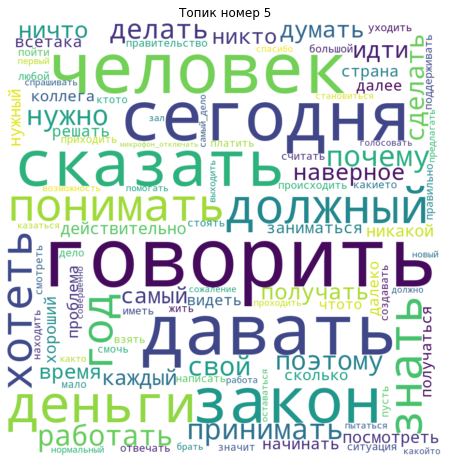

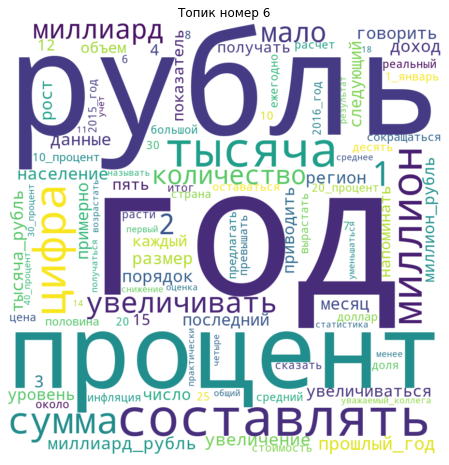

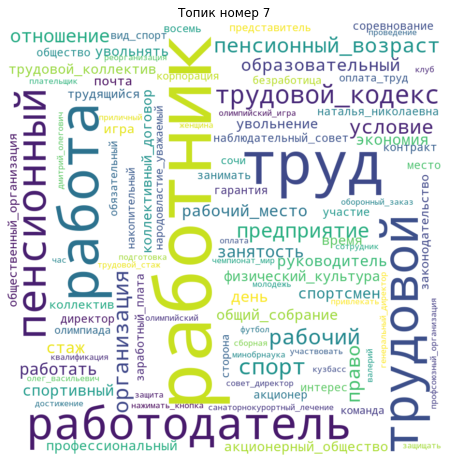

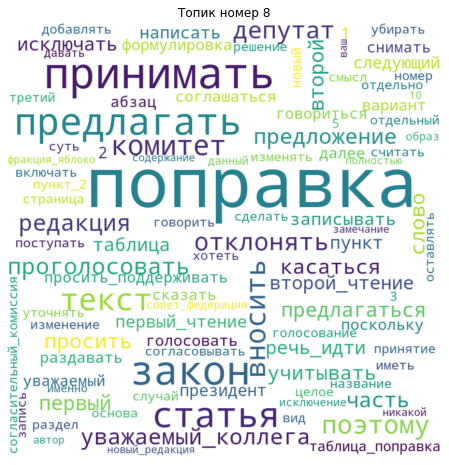

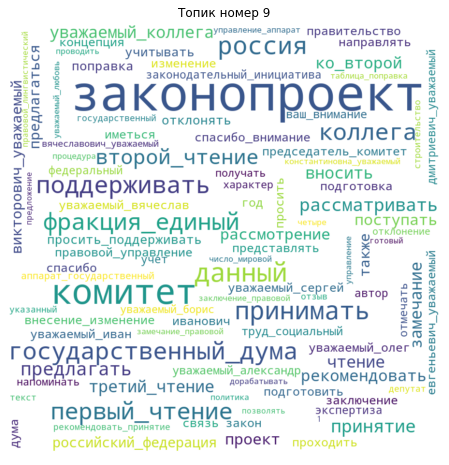

In [11]:
for topic_number in range(10):
    plot_word_cloud(topics, topic_number)

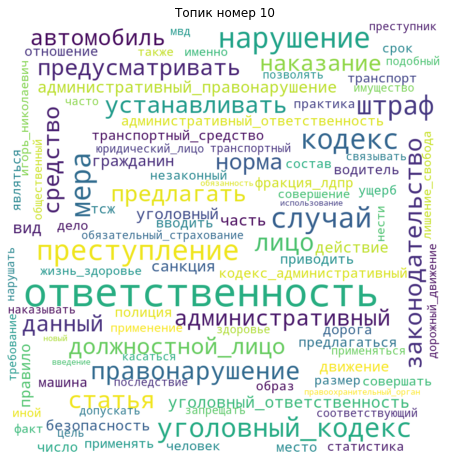

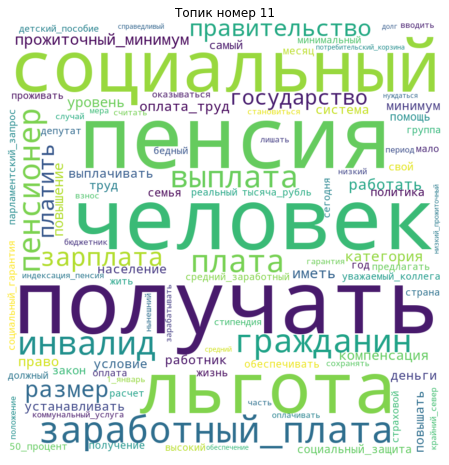

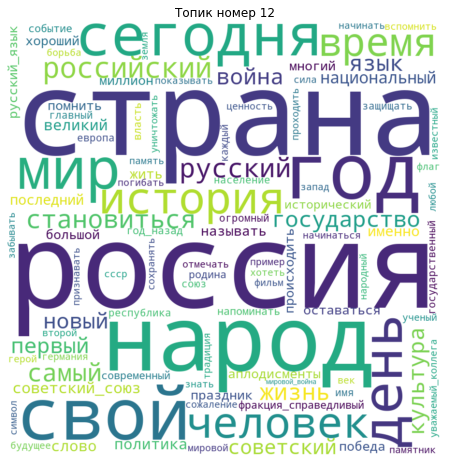

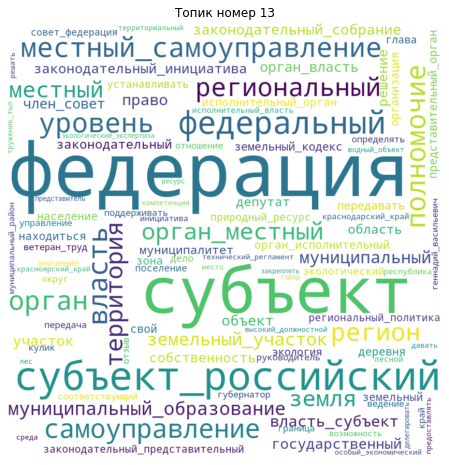

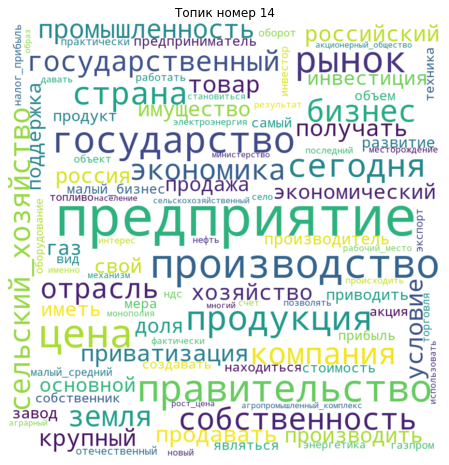

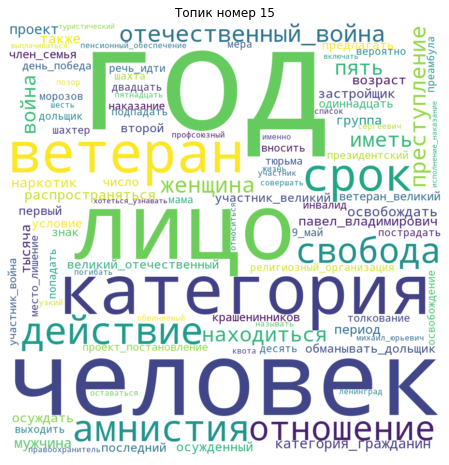

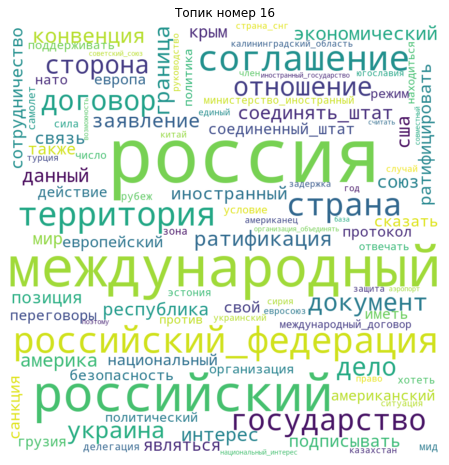

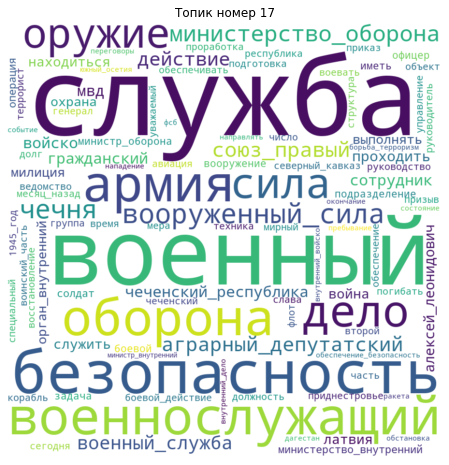

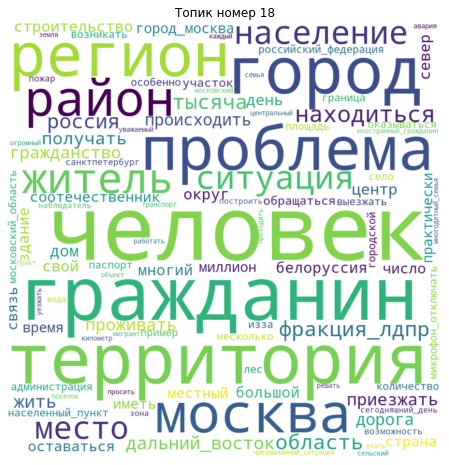

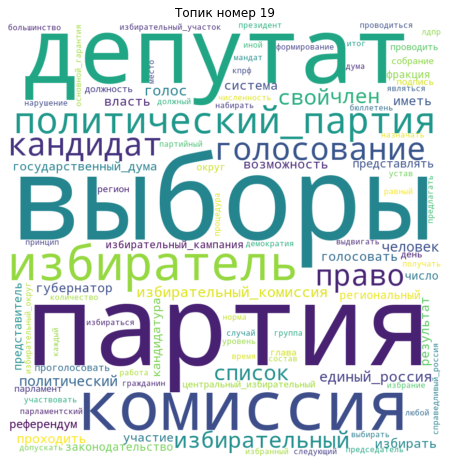

In [12]:
for topic_number in range(10, 20):
    plot_word_cloud(topics, topic_number)

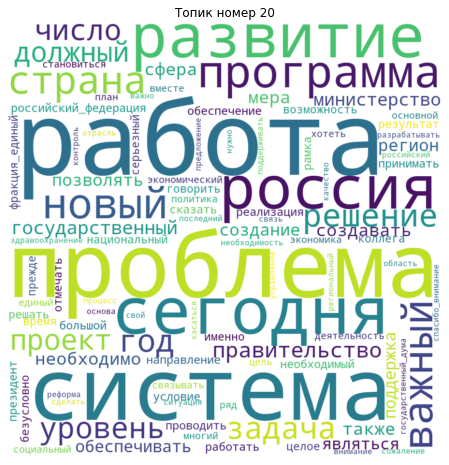

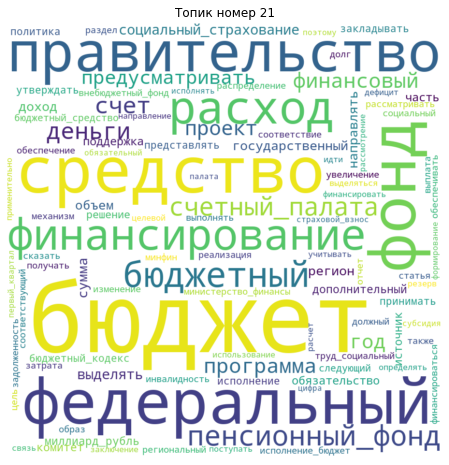

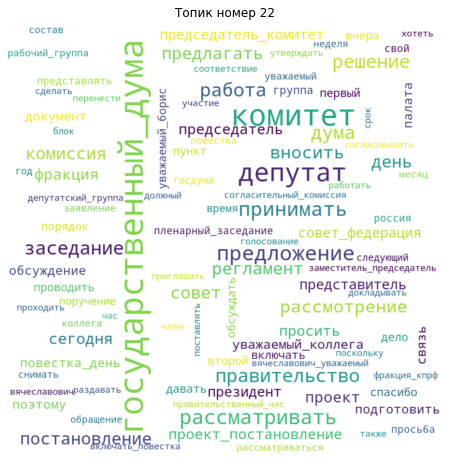

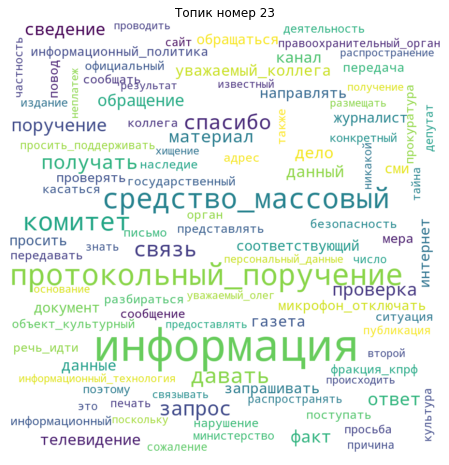

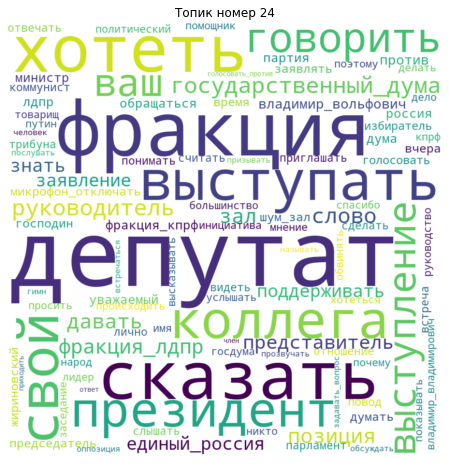

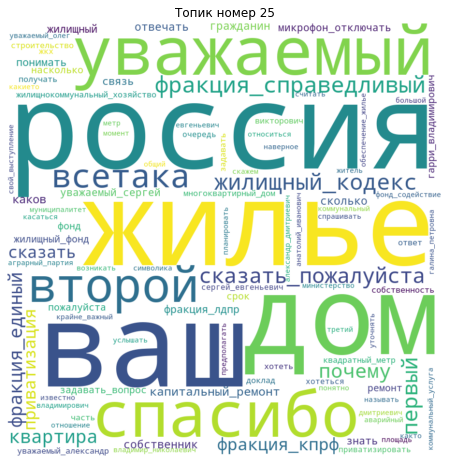

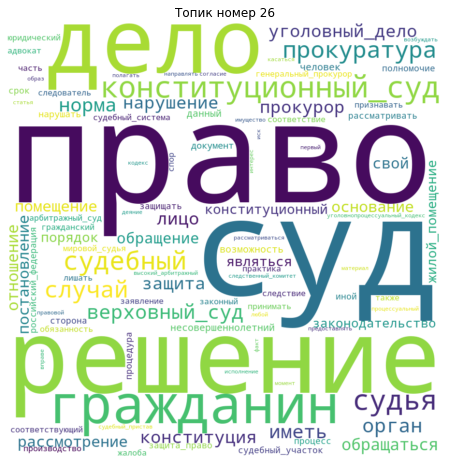

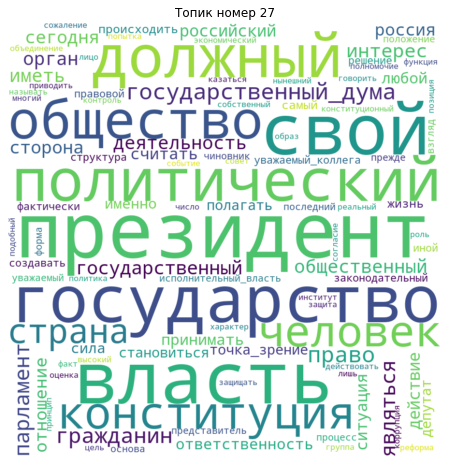

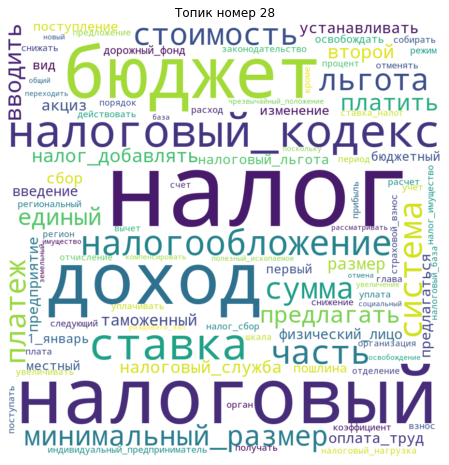

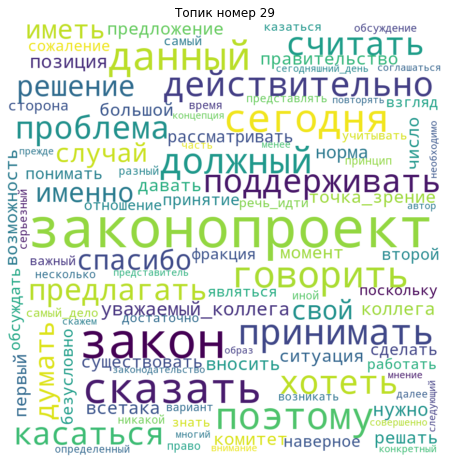

In [13]:
for topic_number in range(20, 30):
    plot_word_cloud(topics, topic_number)

In [3]:
themes_30 = {
    0: 'банки_экономика_цб',
    1: 'госдума_обсуждения',
    2: 'законопроекты',
    3: 'образование',
    4: 'деятельность_организаций',
    5: 'госдума_обсуждения',
    6: 'рубль_реальный_доход',
    7: 'трудовой_кодекс',
    8: 'поправки_законы',
    9: 'госдума_обсуждения',
    10: 'штрафы_наказания',
    11: 'социальные_льготы_пенсии',
    12: 'страна_россия',
    13: 'самоуправление_субъекты',
    14: 'промышленность_предприятия',
    15: 'ветераны_война',
    16: 'международные_отношения',
    17: 'военная_служба_безопасность',
    18: 'проблемы_регионов',
    19: 'выборы_депутаты_партия',
    20: 'проблемы_и_развитие',
    21: 'финансирование_бюджеты',
    22: 'госдума_обсуждения',
    23: 'средства_массовой_информации',
    24: 'госдума_обсуждения',
    25: 'жилищный_кодекс_дома',
    26: 'суд_правовая_система',
    27: 'президент_власть_конституция',
    28: 'налоговый_кодекс',
    29: 'госдума_обсуждения'
}

In [4]:
with open('../src/models/corpus', 'rb') as f:
    corpus = pickle.load(f)

In [6]:
%%time
topic_vectors = pd.DataFrame(
    [dict(i) for i in model.get_document_topics(corpus, minimum_probability=0)]
)

CPU times: user 6min 1s, sys: 38.9 s, total: 6min 40s
Wall time: 2min 3s


In [7]:
deputies = pd.read_csv("../data/processed/deputies.csv", index_col=0)
ID_TO_PARTY = dict(zip(deputies['deputy_id'], deputies['party_name']))
deputies.head()

,party_id,party_name,start_date,end_date,deputy_id,deputy_name,deputy_position
0,72100004,"Фракция Политической партии ""КОММУНИСТИЧЕСКАЯ ...",2011-12-04,2016-10-04,99111772,Абалаков Александр Николаевич,Депутат ГД
1,72100024,"Фракция Всероссийской политической партии ""ЕДИ...",2013-03-06,2016-10-04,99112284,Абасов Мамед Магарамович,Депутат ГД
2,72100020,"Депутатская группа ""Российские регионы""",1996-01-16,1997-11-12,99100491,Абдулатипов Рамазан Гаджимурадович,Депутат ГД
3,72100024,"Фракция Всероссийской политической партии ""ЕДИ...",2011-12-04,2013-01-27,99100491,Абдулатипов Рамазан Гаджимурадович,Депутат ГД
4,72100001,Фракция Аграрной партии России,1994-01-12,1994-07-23,99100001,Абдулбасиров Магомедтагир Меджидович,Депутат ГД


In [8]:
data = pd.read_pickle('../data/processed/transcripts_1994_2021_processed.pkl')
data = data[['deputy_name', 'deputy_id', 'meeting_date']]

In [9]:
assert data.shape[0] == topic_vectors.shape[0]
data = pd.concat([data, topic_vectors], axis=1)
data['year'] = data['meeting_date'].dt.year
data['party'] = data['deputy_id'].map(ID_TO_PARTY)
data.head()

,deputy_name,deputy_id,meeting_date,0,1,2,3,4,5,6,...,22,23,24,25,26,27,28,29,year,party
0,Абалаков Александр Николаевич,99111772,2016-06-15,0.049198,0.000183,0.090196,0.041409,0.000183,0.553986,0.015084,...,0.000183,0.000183,0.038051,0.000183,0.026182,0.000183,0.000183,0.000183,2016,"Фракция Политической партии ""КОММУНИСТИЧЕСКАЯ ..."
1,Абалаков Александр Николаевич,99111772,2015-11-20,0.000681,0.000681,0.312349,0.000681,0.000681,0.000681,0.000681,...,0.000681,0.000681,0.000681,0.175125,0.000681,0.000681,0.000681,0.000681,2015,"Фракция Политической партии ""КОММУНИСТИЧЕСКАЯ ..."
2,Абалаков Александр Николаевич,99111772,2015-11-18,0.000195,0.000195,0.080936,0.012982,0.000195,0.405845,0.029037,...,0.026101,0.000195,0.010844,0.000195,0.061656,0.096479,0.000195,0.000195,2015,"Фракция Политической партии ""КОММУНИСТИЧЕСКАЯ ..."
3,Абалаков Александр Николаевич,99111772,2015-11-17,0.000324,0.000324,0.180452,0.000324,0.036595,0.234084,0.000324,...,0.000324,0.000324,0.067941,0.032602,0.000324,0.000324,0.010482,0.199352,2015,"Фракция Политической партии ""КОММУНИСТИЧЕСКАЯ ..."
4,Абалаков Александр Николаевич,99111772,2015-09-22,0.000108,0.000108,0.000108,0.000108,0.023778,0.481677,0.061077,...,0.000108,0.000108,0.017102,0.000108,0.000108,0.055413,0.073935,0.021905,2015,"Фракция Политической партии ""КОММУНИСТИЧЕСКАЯ ..."


# Кластеризация по годам

In [22]:
topics_by_year = data.groupby(['year']).mean()
umap_by_year = get_umap_representation(topics_by_year)

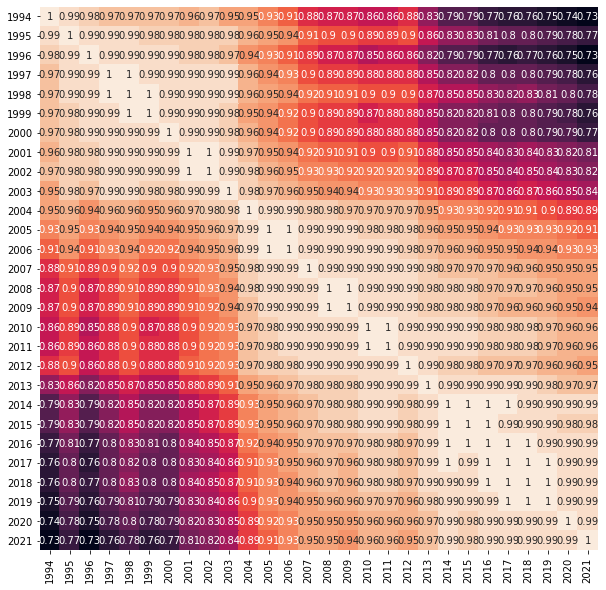

In [23]:
indeces = topics_by_year.index
plt.figure(figsize=(10, 10))
sns.heatmap(
    np.round(cosine_similarity(topics_by_year),2), 
    annot=True, 
    xticklabels=indeces, 
    yticklabels=indeces,
    cbar=None
)
plt.show()

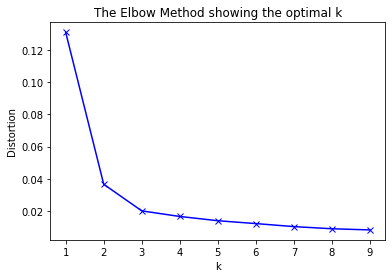

In [24]:
plot_distortions(topics_by_year)

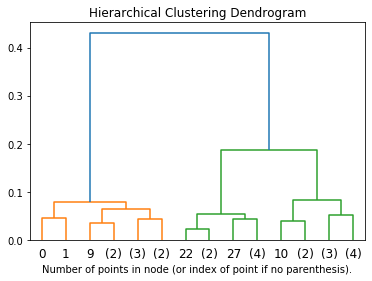

In [25]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(topics_by_year)
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [26]:
model = AgglomerativeClustering(n_clusters=3)
model.fit(topics_by_year)

AgglomerativeClustering(n_clusters=3)

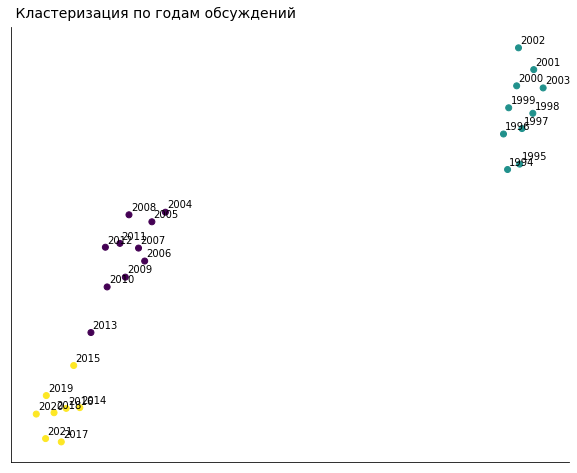

In [27]:
plt.figure(figsize=(10, 8))
plt.scatter(umap_by_year[:,0], umap_by_year[:,1], c=model.labels_)

for x,y,z in zip(umap_by_year[:,0], umap_by_year[:,1], topics_by_year.index):
    label = "{}".format(int(z))
    plt.annotate(label, (x+0.05,y+0.05))
sns.despine()
plt.xticks([])
plt.yticks([])
plt.title(" Кластеризация по годам обсуждений", fontdict={'fontsize':14}, loc='left', pad=10)
plt.show()

# Кластеризация по годам и партиям

In [10]:
shorter_names_map = {
    'Фракция Политической партии "КОММУНИСТИЧЕСКАЯ ПАРТИЯ РОССИЙСКОЙ ФЕДЕРАЦИИ"':"КПРФ",
    'Фракция Всероссийской политической партии "ЕДИНАЯ РОССИЯ"':"ЕДИНАЯ РОССИЯ",
    'Фракция Политической партии ЛДПР - Либерально-демократической партии России':"ЛДПР",
    'Фракция Политической партии СПРАВЕДЛИВАЯ РОССИЯ': "СПРАВЕДЛИВАЯ РОССИЯ",
    'Фракция "Единство - Единая Россия"': "Единство",
    'Депутаты, не входящие во фракции': "Депутаты вне фракции",
    'Агропромышленная депутатская группа': "remove",
    'Фракция "ЯБЛОКО"': "ЯБЛОКО",
    'Фракция "Справедливая Россия - "Родина" (народно-патриотический союз)"': "remove",
    'Фракция "Отечество - Единая Россия"': "Отечество",
    'Фракция "Союз Правых Сил"': "Союз Правых Сил",
    'Депутатская группа "Регионы России (Союз независимых депутатов)"': "remove",
    'Фракция Народно-Патриотический Союз "Родина" (Партия Национального Возрождения "Народная Воля" - Социалистическая единая партия России - "Патриоты России")': "Патриоты России",
    'Фракция "Наш дом - Россия"':"Наш дом - Россия",
    'Депутатская группа "Народный депутат"': "remove",
    'Фракция "Выбор России"': "Выбор России",
    'Фракция Партии российского единства и согласия': "Партия единства и согласия",
    'Аграрная депутатская группа': "remove",
    'Депутатская группа "Стабильность"': "remove",
    'Фракция Аграрной партии России': "Аграрная партия",
    'Депутатская группа "Российские регионы"': "remove",
    'Фракция "Женщины России"': "Женщины России",
    'Депутатская группа "Россия"': "remove"
}

In [11]:
data['party'] = data['party'].map(shorter_names_map)

In [12]:
data.shape

(241999, 35)

In [14]:
data = data[data['party']!='remove']

In [15]:
topics_by_party = data.groupby(['party', 'year']).mean()
umap_by_party = get_umap_representation(topics_by_party)

In [16]:
topics_by_party_umap = topics_by_party.reset_index()[['party', 'year']]
topics_by_party_umap = pd.concat(
    [
        topics_by_party_umap, 
        pd.DataFrame(umap_by_party)
    ], 
    axis=1, 
    ignore_index=True
)

topics_by_party_umap.columns = ['party_name', 'year', 'umap_x', 'umap_y']

In [18]:
party_years_active = {
    "КПРФ":[1993, 2021],
    "ЕДИНАЯ РОССИЯ":[2003, 2021],
    "ЛДПР":[1993, 2021],
    'СПРАВЕДЛИВАЯ РОССИЯ':[2007, 2021],
    'Единство':[1999, 2003],
    'Депутаты вне фракции':[1993, 2021],
    'ЯБЛОКО':[1993, 2003, 2011, 2016],
    'Отечество':[1999, 2003],
    'Союз Правых Сил':[1999, 2003],
    'Патриоты России':[2003, 2007],
    'Наш дом - Россия':[1995, 2000],
    "Выбор России":[1993, 1995],
    'Партия единства и согласия':[1993, 1995],
    'Аграрная партия':[1993, 1995],
    'Женщины России':[1993, 1995]
}

In [41]:
clean_topics_by_year = []

for party, years in party_years_active.items():
    if len(years)==2:
        clean_topics_by_year.append(topics_by_party_umap[
            topics_by_party_umap['party_name'].isin([party])&
            (topics_by_party_umap['year'] >= years[0])&
            (topics_by_party_umap['year'] <= years[1])
        ])
        
    else:
        
        condition1 = ((topics_by_party_umap['year'] >= years[0])&
            (topics_by_party_umap['year'] <= years[1])).values
        condition2 = ((topics_by_party_umap['year'] >= years[2])&
                    (topics_by_party_umap['year'] <= years[3])).values

        clean_topics_by_year.append(topics_by_party_umap[
            topics_by_party_umap['party_name'].isin([party])&
            np.any([condition1, condition2], axis=0)
        ])

In [45]:
clean_topics_by_year = pd.concat(clean_topics_by_year)

/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


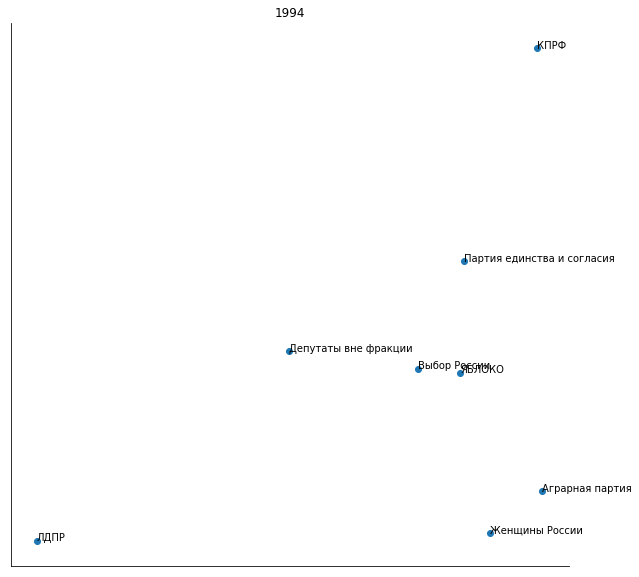

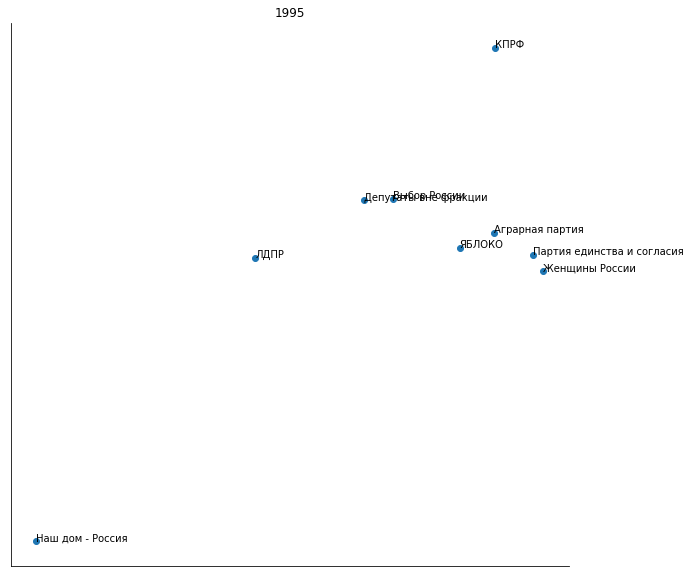

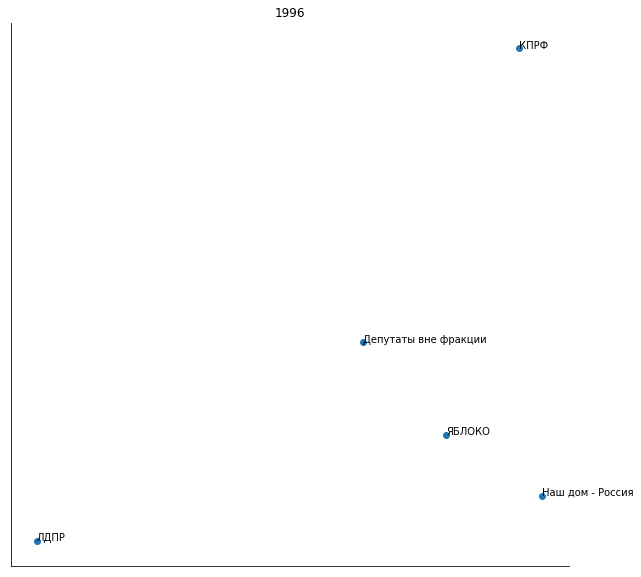

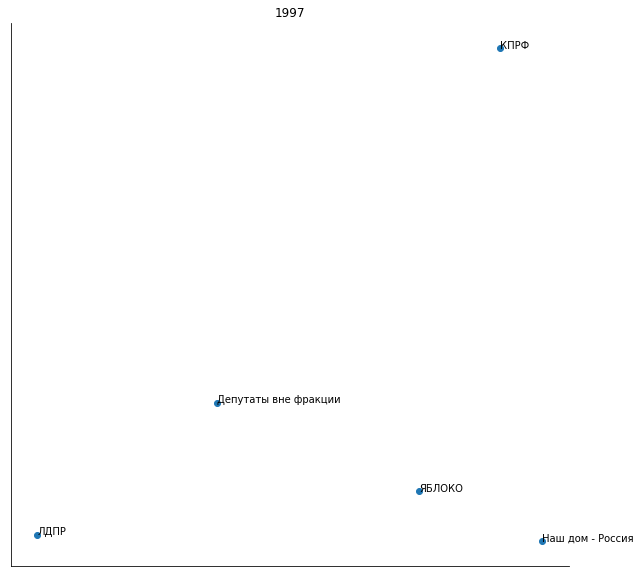

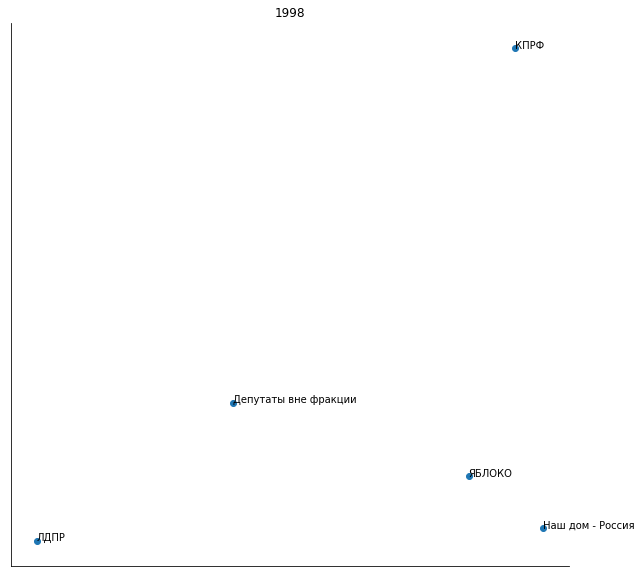

...

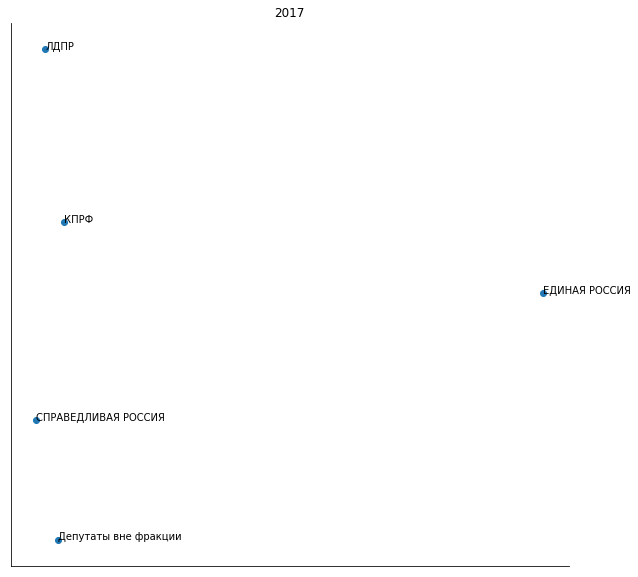

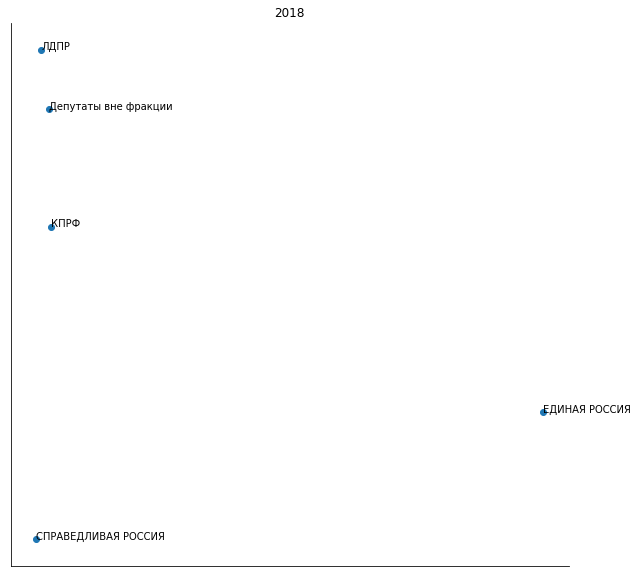

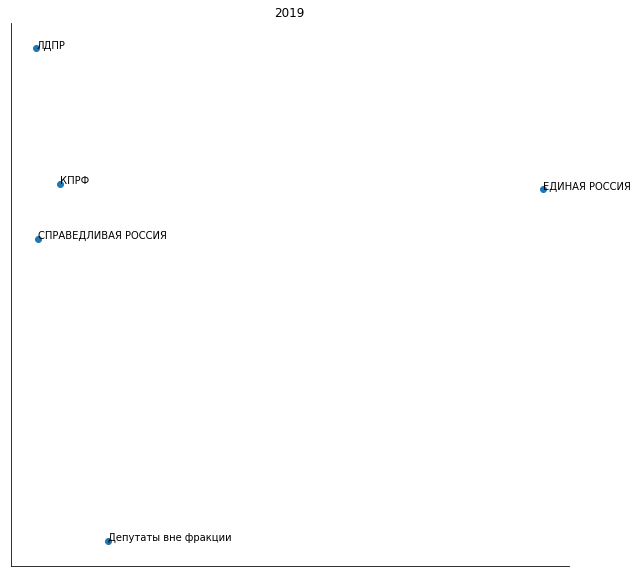

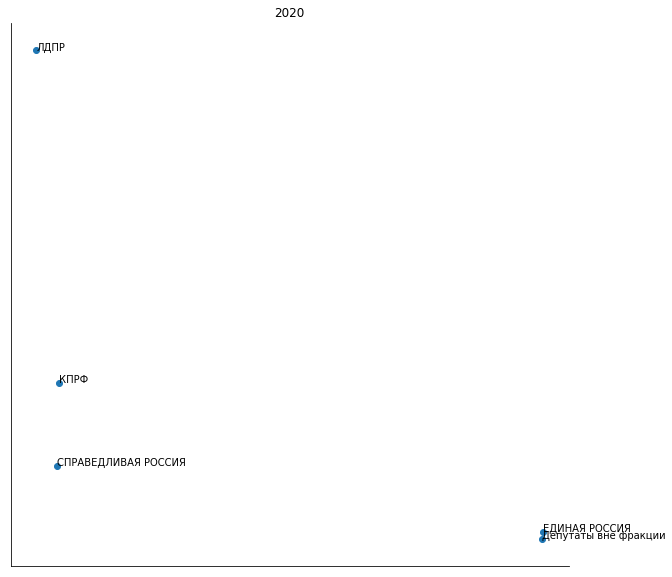

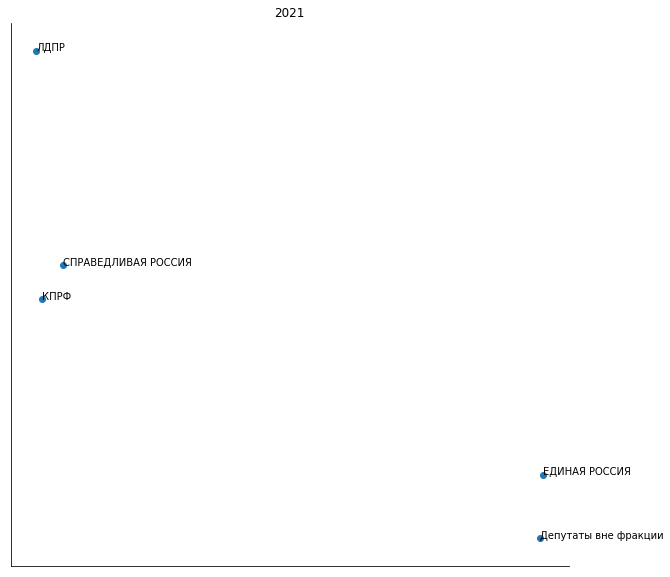

In [46]:
for year in range(1994, 2022):
    current_year = clean_topics_by_year[
        (topics_by_party_umap['year'].isin([year]))
    ]
    plt.figure(figsize=(10,10))
    plt.scatter(current_year['umap_x'], current_year['umap_y'])
    plt.title(year)
    for x,y,z in zip(
        current_year['umap_x'], 
        current_year['umap_y'], 
        current_year['party_name']
        ):
        label = "{}".format(z)
        plt.annotate(label, (x,y))
    sns.despine()
    plt.xticks([])
    plt.yticks([])
    plt.show()

# Тематические профили

In [47]:
def profile_plot(theme_profile, option, themes=themes_30):
    """
    Строит тематическией профиль для каждого варианта
    theme_profiles:
        тематический профиль, dict
    music_style: 
        стиль музыки
    themes dict:
        названия тем
    """
    sorted_prof = sorted(theme_profile, key=lambda w: w[1], reverse=True)   
    # рисуем картинку
    sns.set(font_scale=2)
    plt.subplots(figsize=(30, 40))
    
    prof = np.array([pr[1] for pr in sorted_prof]).reshape(1,-1)
    them = [themes[pr[0]] for pr in sorted_prof]
    
    ax = plt.axes()    
    sns.heatmap(prof, ax = ax, square=True, annot=True, fmt=".2f", linewidths=0.1, 
                 cmap="YlGnBu", cbar=False, yticklabels='', xticklabels=them )
    ax.set_title('Тематический профиль для {}: \n'.format(option))
    plt.show()

In [49]:
topics_by_year = data.groupby(['year']).mean()
columns_to_remove = [1, 5, 9, 22, 24, 29, 'year']
topics_by_year = topics_by_year[[
    col for col in topics_by_year.columns if col not in columns_to_remove
]]

# нормализация
topics_by_year = topics_by_year.div(topics_by_year.sum(1), axis=0)

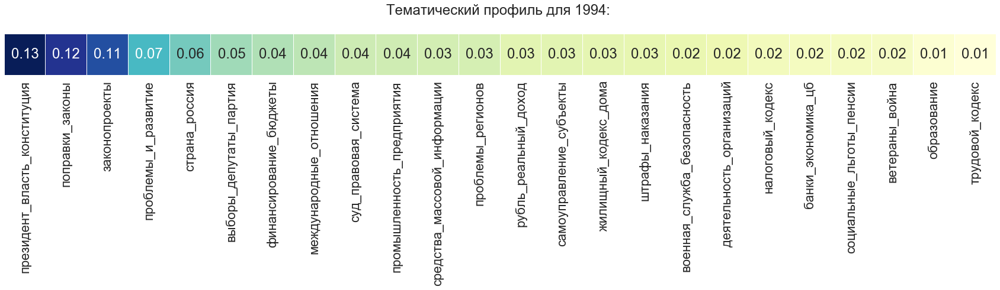

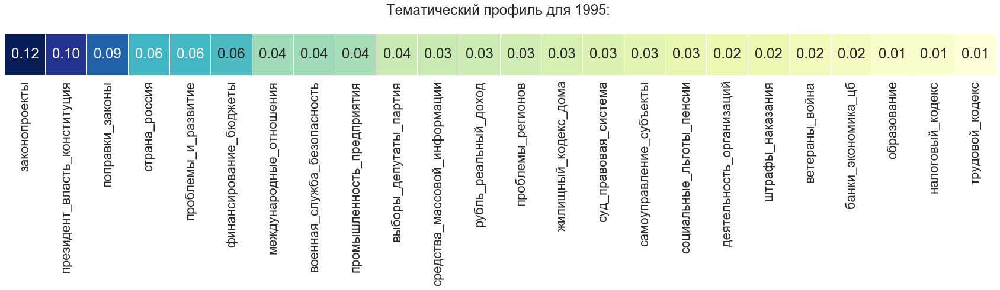

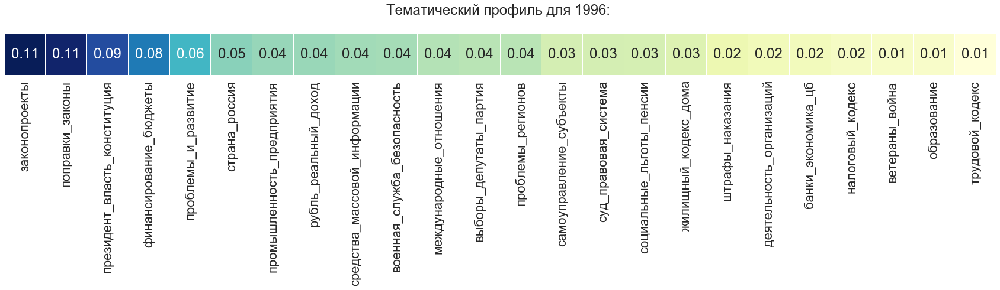

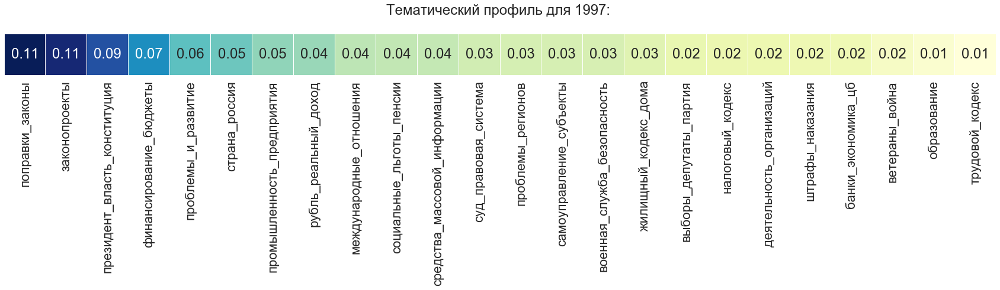

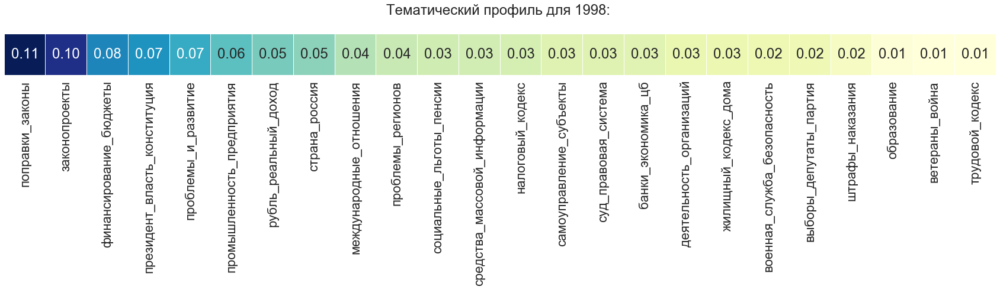

...

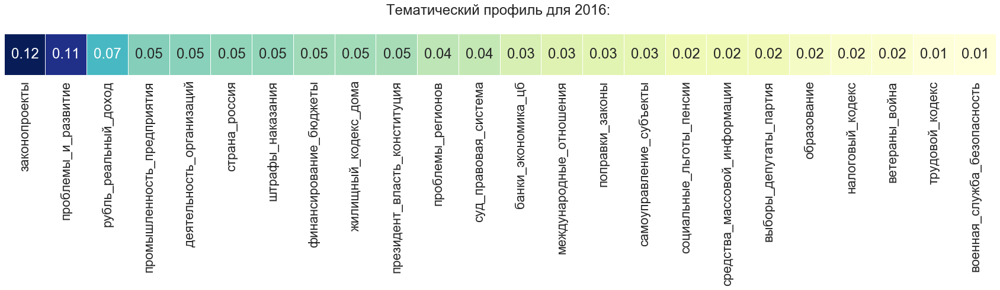

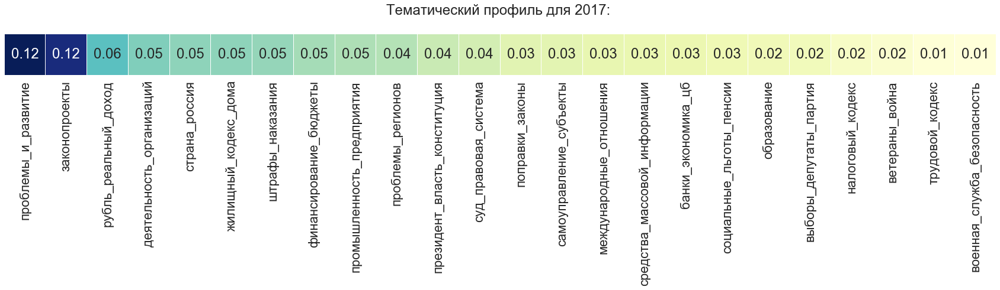

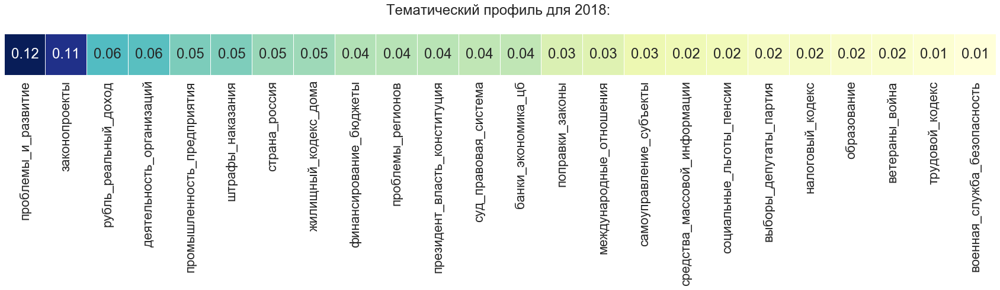

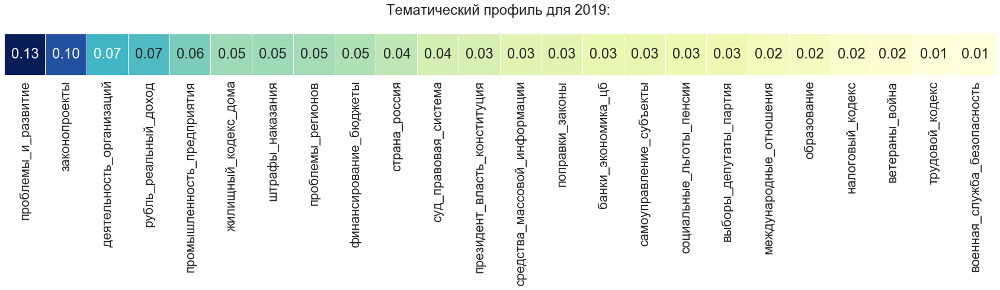

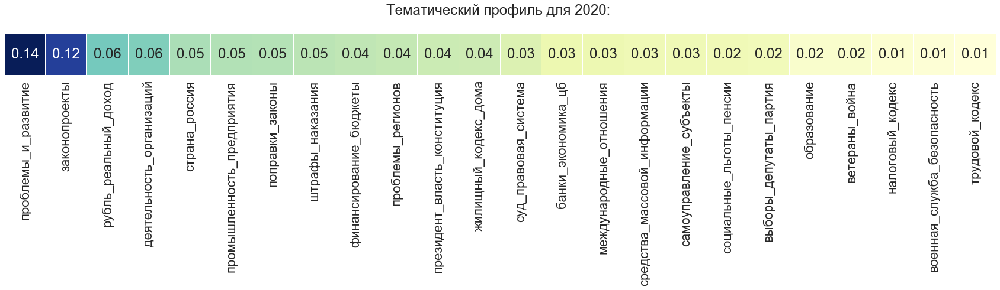

In [39]:
for year in range(1994, 2021):
    profile_plot(list(zip(topics_by_year.loc[year].index, topics_by_year.loc[year])), year)

# Политическая карта

In [54]:
topics_by_party = data.groupby(['party']).mean()

columns_to_remove = [1, 5, 9, 22, 24, 29, 'year']
topics_by_party = topics_by_party[[
    col for col in topics_by_party.columns if col not in columns_to_remove
]]

# нормализация
topics_by_party = topics_by_party.div(topics_by_party.sum(1), axis=0)

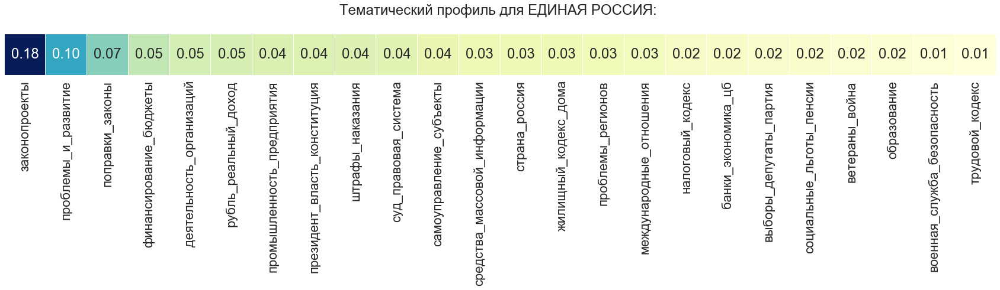

In [41]:
party_name = 'ЕДИНАЯ РОССИЯ'
profile_plot(
    list(zip(topics_by_party.loc[party_name].index, topics_by_party.loc[party_name])), 
    party_name
)

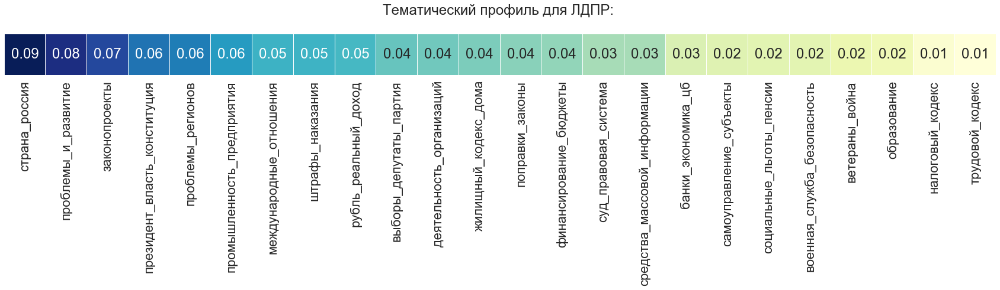

In [42]:
party_name = 'ЛДПР'
profile_plot(
    list(zip(topics_by_party.loc[party_name].index, topics_by_party.loc[party_name])), 
    party_name
)

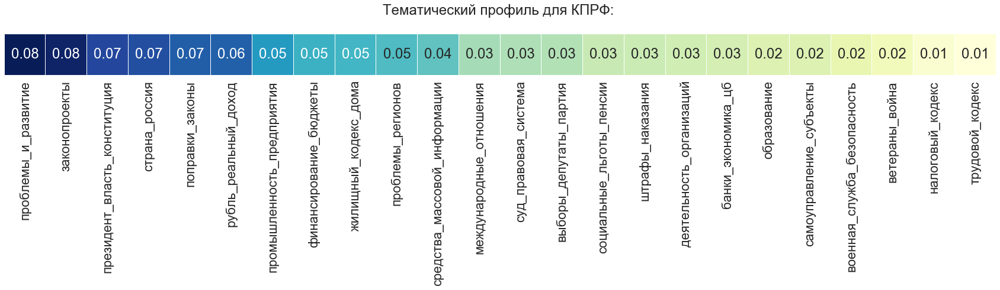

In [43]:
party_name = 'КПРФ'
profile_plot(
    list(zip(topics_by_party.loc[party_name].index, topics_by_party.loc[party_name])), 
    party_name
)

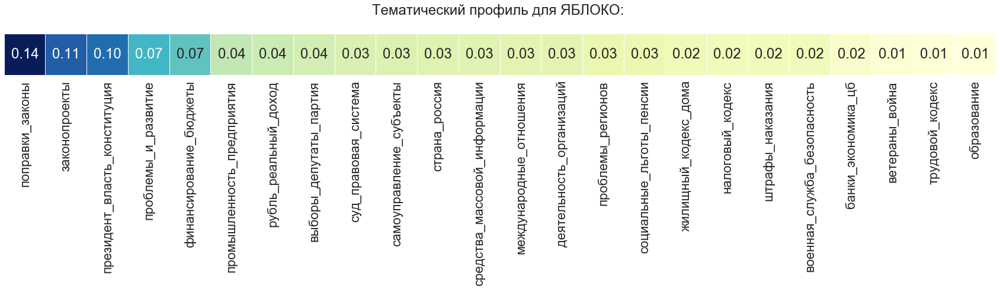

In [44]:
party_name = 'ЯБЛОКО'
profile_plot(
    list(zip(topics_by_party.loc[party_name].index, topics_by_party.loc[party_name])), 
    party_name
)

In [55]:
cosine_similarity_by_party = pd.DataFrame(np.round(cosine_similarity(topics_by_party),2))
cosine_similarity_by_party.index = topics_by_party.index
cosine_similarity_by_party.columns = topics_by_party.index

In [56]:
cosine_similarity_by_party = cosine_similarity_by_party.sort_values(
    by='ЕДИНАЯ РОССИЯ', 
    ascending=False, 
    axis=1
)
cosine_similarity_by_party = cosine_similarity_by_party.sort_values(
    by='ЕДИНАЯ РОССИЯ', 
    ascending=False, 
    axis=0
)

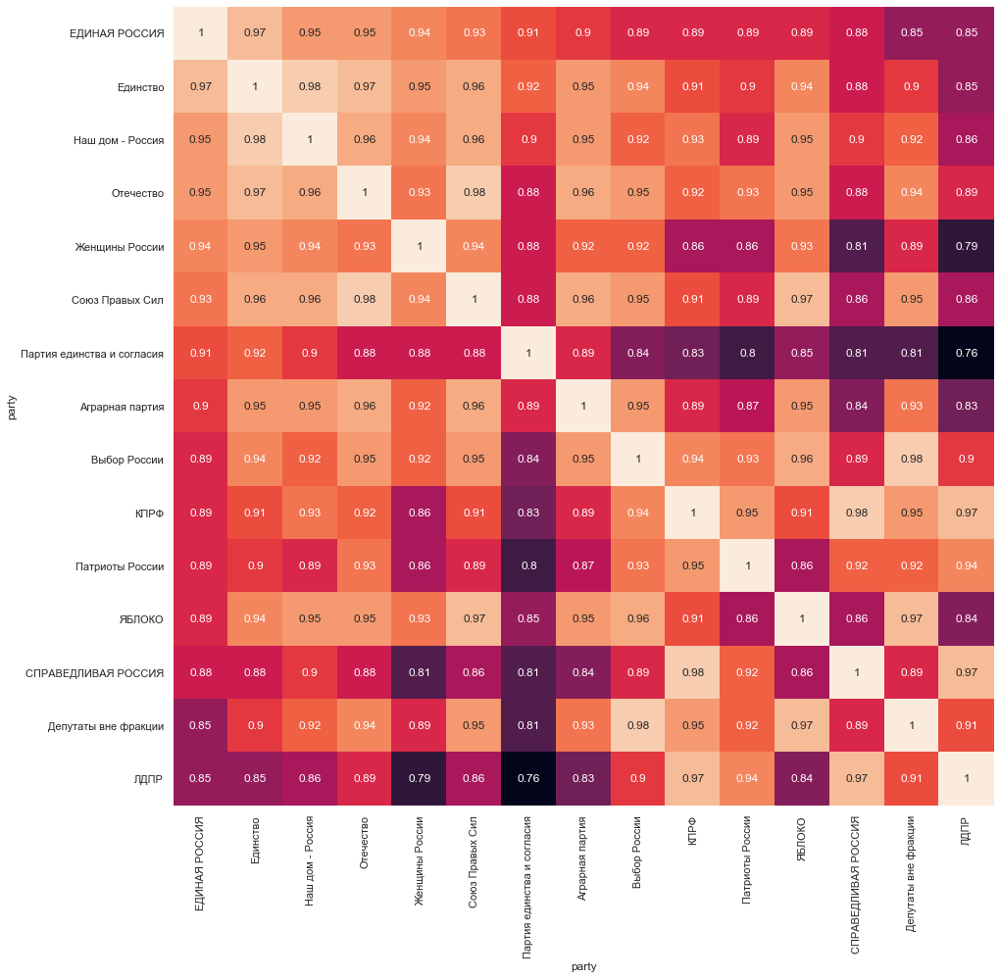

In [57]:
plt.figure(figsize=(15, 15))
sns.set(font_scale=1)
sns.heatmap(
    cosine_similarity_by_party, 
    annot=True, 
    cbar=None
)
plt.show()

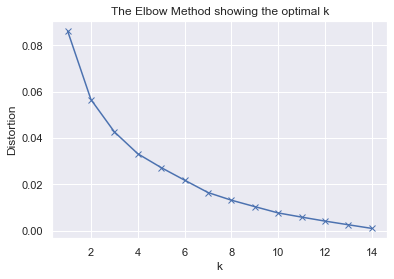

In [59]:
plot_distortions(topics_by_party, n_clusters_range=(1, 15))

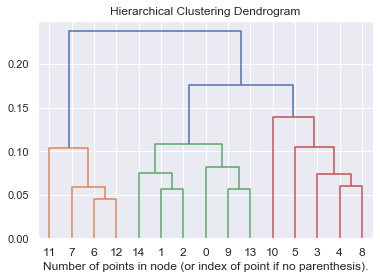

In [60]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(topics_by_party)
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(model, truncate_mode='level', p=10)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [63]:
model = AgglomerativeClustering(n_clusters=7).fit(topics_by_party)

/usr/local/anaconda3/lib/python3.7/site-packages/umap/umap_.py:1383: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  "n_neighbors is larger than the dataset size; truncating to "


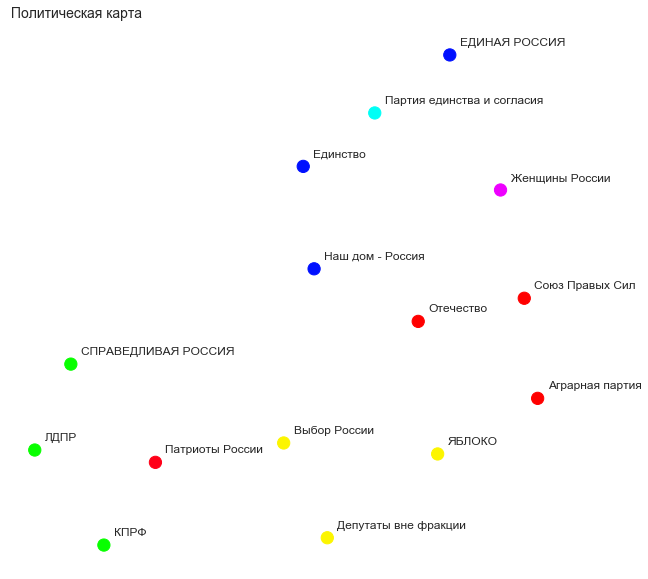

In [67]:
umap_by_party = get_umap_representation(topics_by_party, random_state=1)

plt.rcParams['axes.facecolor'] = 'white'
plt.figure(figsize=(10, 10))
plt.scatter(
    umap_by_party[:,0], 
    umap_by_party[:,1], 
    c=model.labels_,
    s=150,
    cmap='hsv'
)

for x,y,z in zip(umap_by_party[:,0], umap_by_party[:,1], topics_by_party.index):
    label = "{}".format(z)
    plt.annotate(label, (x+0.05,y+0.05))
sns.despine()
plt.xticks([])
plt.yticks([])
plt.title(" Политическая карта", fontdict={'fontsize':14}, loc='left', pad=10)
plt.show()

# Как менялись топики по годам? 

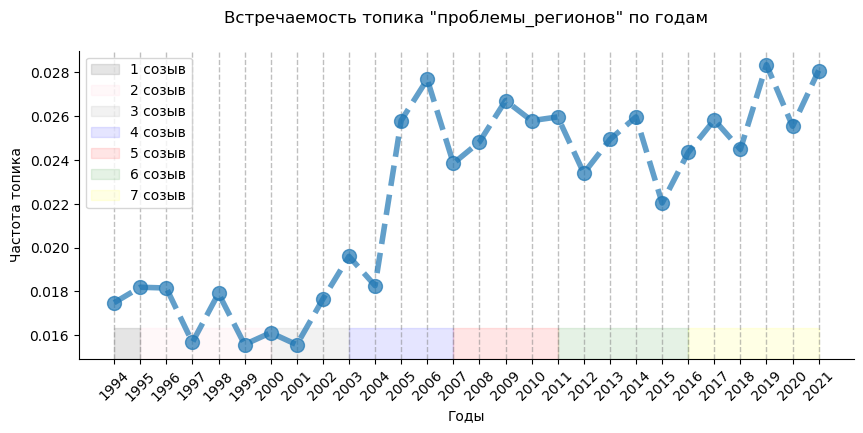

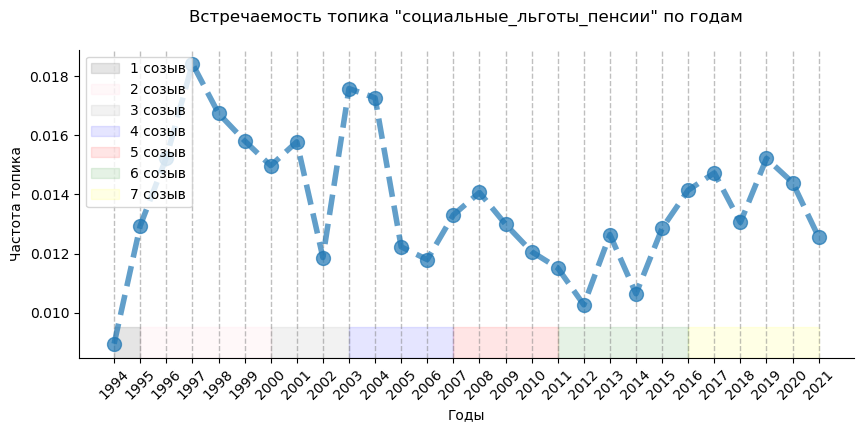

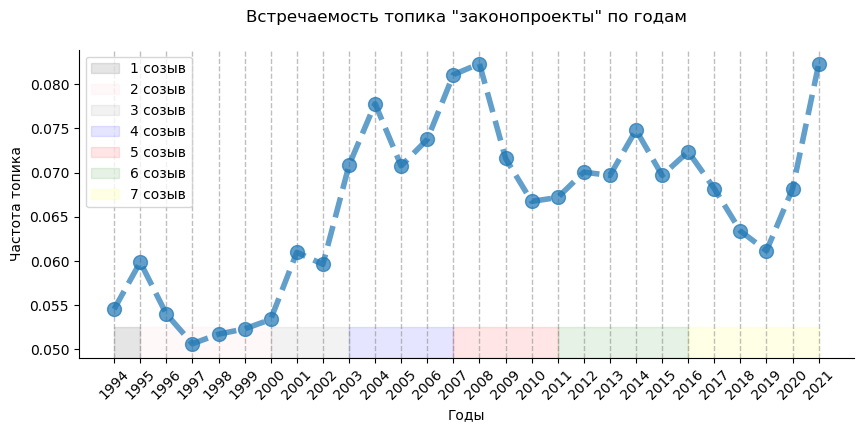

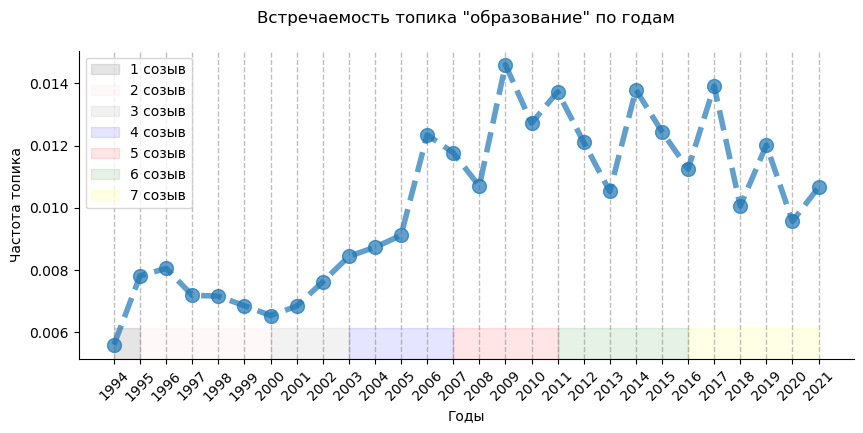

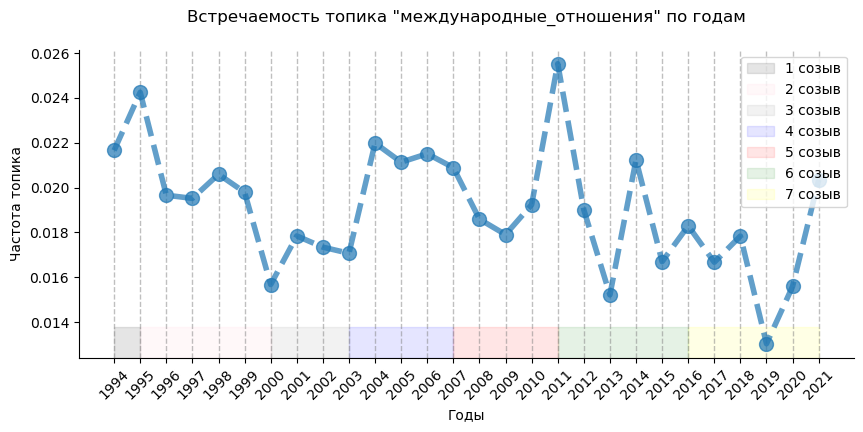

...

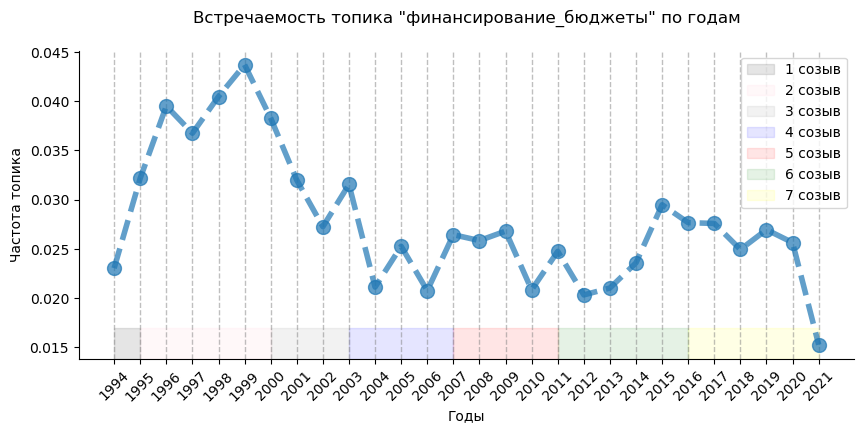

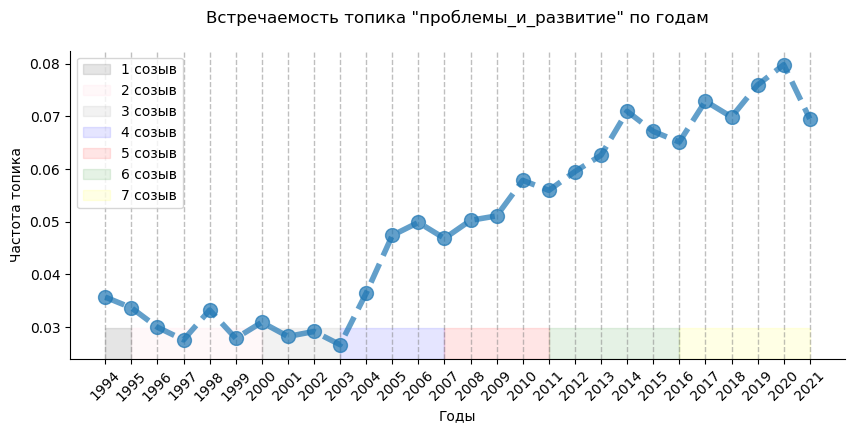

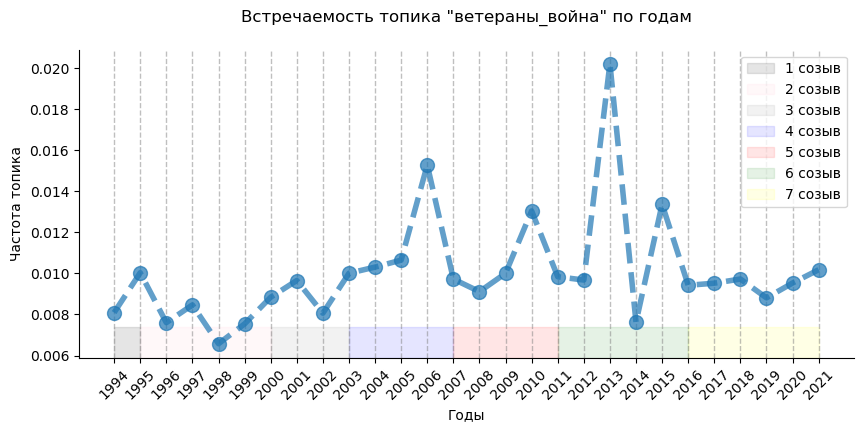

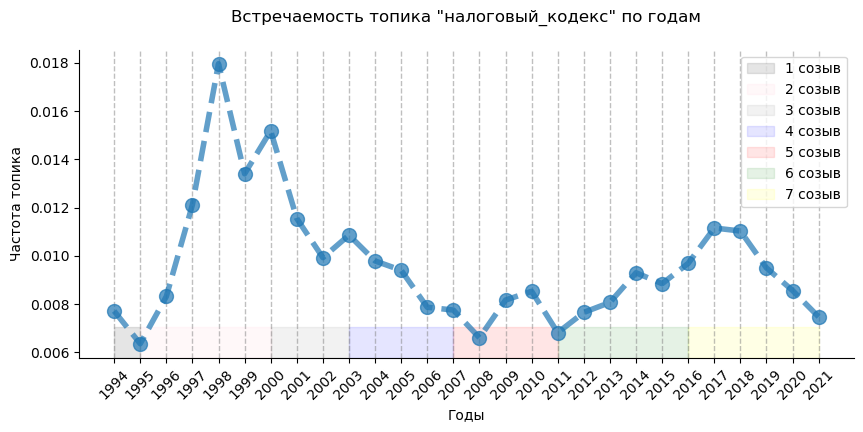

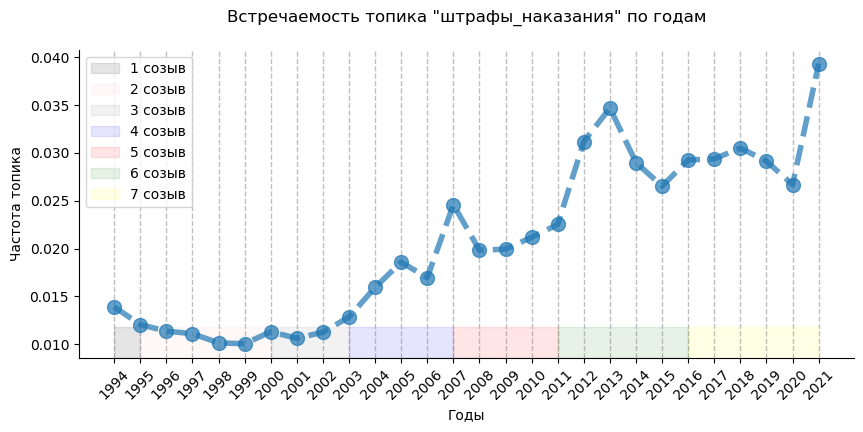

In [68]:
topics_to_remove = [
    'госдума_обсуждения'
]

# Созывы госдумы
duma_years = [
    [1, 1994, 1995, 'black'],
    [2, 1995, 2000, 'pink'],
    [3, 2000, 2003, 'grey'],
    [4, 2003, 2007, 'blue'],
    [5, 2007, 2011, 'red'],
    [6, 2011, 2016, 'green'],
    [7, 2016, 2021, 'yellow']
]

topics_by_year = data.groupby(['year']).mean()
topics_by_year.columns = topics_by_year.columns.map(themes_30)

matplotlib.rc_file_defaults()
for topic in list(set(topics_by_year.columns)-set(topics_to_remove)):

    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(
        topics_by_year[topic], 
        'o--', 
        linewidth=4, 
        markersize=10,
        alpha=0.7
    )
    plt.title(f'Встречаемость топика "{topic}" по годам', pad=20)
    plt.ylabel("Частота топика")
    plt.xlabel("Годы")
    plt.xticks(range(1994, 2022), rotation=45)
    for number, year_start, year_end, color in duma_years:
        ax.axvspan(year_start, year_end, ymax=0.1, alpha=0.1, color=color, label=f'{number} созыв')
    plt.grid(axis='x', linewidth=1, alpha=0.5, linestyle='dashed', color='grey')
    plt.legend()
    sns.despine()
    plt.show()
    print('\n')